<a href="https://colab.research.google.com/github/avivajpeyi/Bayesian_Lectures/blob/master/LineModelFullHyperPE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Hyper-PE Example using $\vec{y}=\text{c}0+\text{c}1 \vec{x}$

This notebook presents an example of a parameter estimation followed by hyper parameter estimation using a line model. The equations for this notebook can be found [here](https://arxiv.org/pdf/1809.02293.pdf).

##### Setup

In [0]:
%%capture
! rm -rf outdir;
! pip install bilby;
OUT_DIR = "outdir"

#####  Plotting utils

In [0]:
import plotly.graph_objs as go
from plotly.offline import iplot, plot
from plotly import tools as plotly_tools
def enable_plotly_in_cell():
    import IPython
    from plotly.offline import init_notebook_mode

    display(
        IPython.core.display.HTML(
            ''' <script src="/static/components/requirejs/require.js"></script>'''
        )
    )
    init_notebook_mode(connected=False)
    

from itertools import cycle

def plotly_color_map(names):
    # From https://stackoverflow.com/a/44727682
    plotly_colors = cycle(['#1f77b4',  # muted blue
                           '#ff7f0e',  # safety orange
                           '#2ca02c',  # cooked asparagus green
                           '#d62728',  # brick red
                           '#9467bd',  # muted purple
                           '#8c564b',  # chestnut brown
                           '#e377c2',  # raspberry yogurt pink
                           '#7f7f7f',  # middle gray
                           '#bcbd22',  # curry yellow-green
                           '#17becf'  # blue-teal
                           ])

    return dict(zip(names, plotly_colors))

In [0]:
def plot_data(data_dict):
    enable_plotly_in_cell()
    traces = []
    for label, d in data_dict.items():
      
        if d.inject_signal:
          name="{}: {:.1f} {:+.1f}x".format(d.label, d.c0, d.c1)
        else:
          name = d.label

        trace = go.Scatter(
            x=d.x,
            y=d.data_vals,
            name=name,
            line=dict(width=3),
            showlegend=True,
        )
        traces.append(trace)

    layout = dict(
        title='Visulising the data',
        xaxis=dict(title='x'),
        yaxis=dict(title='y(x)'),
        annotations=[
            dict(
                x=X_MIN,
                y=AVG[C0_KEY],
                xref='x',
                yref='y',
                text='AVG C0 = {}'.format(AVG[C0_KEY]),
                showarrow=True,
                arrowhead=7,
                ax=+50,
                ay=-40,
            )
        ],
    )
    fig = dict(data=traces, layout=layout)
    iplot(fig, filename='raw_data.html')

In [0]:
def plot_sampling_results(results_dict):
    enable_plotly_in_cell()
    cm = plotly_color_map(results_dict.keys())
    fig = plotly_tools.make_subplots(rows=1, cols=2)

    for label, d in results_dict.items():
        result = d.pe_result
      
        if d.inject_signal:
          name="{}: {:.1f} {:+.1f}x".format(d.label, d.c0, d.c1)
        else:
          name = d.label
      
        c0trace = go.Histogram(
            x=result.posterior[[C0_KEY]].values.flatten(),
            opacity=0.50,
            name=name,
            histnorm='probability',
            marker=dict(color=cm[label]),
        )
        fig.append_trace(c0trace, 1, 1)
        c1trace = go.Histogram(
            x=result.posterior[[C1_KEY]].values.flatten(),
            opacity=0.50,
            name=name,
            histnorm='probability',
            marker=dict(color=cm[label]),
            showlegend=False,
        )
        fig.append_trace(c1trace, 1, 2)

    layout = dict(
        title='PE samples',
        xaxis=dict(title='c0'),
        yaxis=dict(title='density'),
        xaxis2=dict(title='c1'),
        yaxis2=dict(title='density'),
        barmode='overlay',
        annotations=[
            dict(
                x=AVG[C0_KEY],
                y=0,
                xref='x',
                yref='y',
                text='Avg {} = {}'.format(C0_KEY, AVG[C0_KEY]),
                showarrow=True,
                arrowhead=7,
                ax=0,
                ay=-50,
                font=dict(color="black"),
                arrowcolor="black",
            ),
            dict(
                x=AVG[C1_KEY],
                y=0,
                xref='x2',
                yref='y2',
                text='Avg {} = {}'.format(C1_KEY, AVG[C1_KEY]),
                showarrow=True,
                arrowhead=7,
                ax=0,
                ay=-50,
                font=dict(color="black"),
                arrowcolor="black",
            ),
        ],
    )
    fig['layout'].update(layout)
    iplot(fig, filename='c0c1_histogram.html')

## Generate Line Datasets: $D=\{\vec{d_0}...,\vec{d_N} \}$

### Parameters for data generation

In [0]:
NUM_DATASETS = 10                # size of D
NUM_DATAPOINTS_PER_DATASET = 10  # size of di
FRACTION_WITH_SIGNAL = 0.8       # % of D contains signal

NOISE_MU = 0
NOISE_SIGMA = 2

# picking out c0 and c1 from gaussian distributions
C0_MU_TRUE = 5
C0_SIGMA_TRUE = 1 
C1_MU_TRUE = -1.5
C1_SIGMA_TRUE = 1

In [0]:
import numpy as np
def get_c0():
  return np.random.normal(C0_MU_TRUE, C0_SIGMA_TRUE)
  
def get_c1():
  return np.random.normal(C1_MU_TRUE, C1_SIGMA_TRUE)
  
X_MIN = 0
X_MAX = 10

C0_KEY = 'c0'
C1_KEY = 'c1'


AVG = {C0_KEY: C0_MU_TRUE, C1_KEY: C1_MU_TRUE}
assert (
    0 <= FRACTION_WITH_SIGNAL <= 1
), "Fraction with signal must be between 0 and 1"


### Line and Nosie model definitions

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from typing import TypeVar

ndfloats = TypeVar('ndfloats', float, list, np.ndarray)


def line_model(c0: float, c1: float, x: ndfloats) -> ndfloats:
    return c0 + c1 * x


def noise_model(number_datapoints: int) -> np.ndarray:
    return np.random.normal(
        loc=NOISE_MU, scale=NOISE_SIGMA, size=number_datapoints
    )

### Data generation and storage

In [0]:
from typing import List

class DataContainer(object):
    def __init__(
        self, 
        c0: float, 
        c1: float, 
        x: np.ndarray, 
        id: int, 
        inject_signal: bool
    ):
        self.x = x
        self.N = NUM_DATAPOINTS_PER_DATASET
        self.label = "{}_{}".format("signal" if inject_signal else "noise", id)
        self.n = noise_model(self.N)
        self.inject_signal = inject_signal
        if inject_signal:
            self.y = line_model(c0, c1, x)
            self.c0 = c0
            self.c1 = c1
            self.data_vals = self.y + self.n
        else:
            self.y = None
            self.c0 = None
            self.c1 = None
            self.data_vals = self.n
        self.pe_result = None


def generate_data_list(
    number_datasets: int,
    number_datapoints_per_dataset: int,
    fraction_with_signals: float,
)->List[DataContainer]:
    x = np.linspace(X_MIN, X_MAX, number_datapoints_per_dataset)

    inject_signal = [
        True if val < fraction_with_signals else False
        for val in np.random.uniform(0, 1, number_datapoints_per_dataset)
    ]

    data_dict = [
        DataContainer(
            c0=get_c0(),
            c1=get_c1(),
            x=x,
            id=id,
            inject_signal=inject_signal[id],
        )
        for id in range(number_datasets)
    ]
    
    data_dict = {d.label:d for d in data_dict}

    return data_dict


### Generate and plot data

In [9]:
data_dict  = generate_data_list(
    number_datasets=NUM_DATASETS,
    number_datapoints_per_dataset=NUM_DATAPOINTS_PER_DATASET,
    fraction_with_signals=FRACTION_WITH_SIGNAL)

plot_data(data_dict)

## Parameter Estimation

### Defining $L(\vec{d_i}|\text{c}0)$

In [0]:
from scipy.stats import norm
import bilby

class LineModelLikelihood(bilby.Likelihood):
    def __init__(self, data:DataContainer):
        self.data = data
        self.parameters = {C0_KEY: None, C1_KEY: None}

    def log_likelihood(self):
        c0 = self.parameters[C0_KEY]
        c1 = self.parameters[C1_KEY]
        sig = line_model(c0, c1, self.data.x)
        res = self.data.data_vals - sig
        lnL_d_i = norm.logpdf(res, loc=NOISE_MU, scale=NOISE_SIGMA)
        lnL = np.sum(lnL_d_i)
        return lnL

    def noise_log_likelihood(self):
        lnL_d_i = norm.logpdf(self.data.data_vals, loc=NOISE_MU, scale=NOISE_SIGMA)
        lnL = np.sum(lnL_d_i)
        return lnL
      
def get_c0c1_prior(num_sigma=3):
    c0_nsigma = num_sigma * C0_SIGMA_TRUE 
    c1_nsigma = num_sigma * C1_SIGMA_TRUE
  
    line_pe_prior = bilby.core.prior.PriorDict(
        {
            C0_KEY: bilby.core.prior.Uniform(
                minimum=C0_MU_TRUE - c0_nsigma,
                maximum=C0_MU_TRUE + c0_nsigma,
                name=C0_KEY,
                latex_label=C0_KEY,
            ),
            C1_KEY: bilby.core.prior.Uniform(
                minimum=C1_MU_TRUE - c1_nsigma,
                maximum=C1_MU_TRUE + c1_nsigma,
                name=C1_KEY,
                latex_label=C1_KEY,
            ),
        }
    )
    return line_pe_prior


In [0]:
def sample_c0c1_for_data(
    data_dict: dict,
    pior_dict: bilby.core.prior.PriorDict,
    outdir: str,
) -> dict:
    for label, data_object in data_dict.items():

        # run PE
        likelihood = LineModelLikelihood(data_object)
        result = bilby.run_sampler(
            likelihood=likelihood,
            priors=line_pe_prior,
            sampler='dynesty',
            npoints=500,
            walks=10,
            outdir=outdir,
            label=data_object.label,
        )
        result.plot_corner(
            truth={
                C0_KEY: data_object.c0,
                C1_KEY: data_object.c1,
            }
        )

        # save result in dict
        data_object.pe_result = result
        data_dict.update({label: data_object})

    return data_dict


### Sample $P(\text{c}0| \vec{d_i})\ \forall\  \vec{d_i}\in D$

In [0]:
line_pe_prior = get_c0c1_prior() 
pe_results_dict = sample_c0c1_for_data(data_dict, line_pe_prior, OUT_DIR)

#### Plotting one signal's PE result

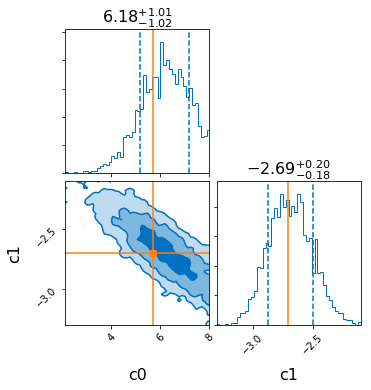

In [13]:
signal_labels = [s for s in pe_results_dict.keys() if "signal" in s]
signal_data =  pe_results_dict[signal_labels.pop()]
signal_data.pe_result.plot_corner(
    truth={
        C0_KEY: signal_data.c0,
        C1_KEY: signal_data.c1,
    }
)

#### Plotting all PE results

In [14]:
plot_sampling_results(pe_results_dict)  

This is the format of your plot grid:
[ (1,1) x1,y1 ]  [ (1,2) x2,y2 ]



### Summarise PE Results

In [0]:
import pandas as pd   

LOG_EVIDENCE = 'log_evidence'
LOG_BAYES_FACTOR = 'log_bayes_factor'
LOG_NOISE_EVIDENCE = 'log_noise_evidence'


class ResultSummary(object):
  def __init__(self, result, label):
    pe_result = result
    self.log_bayes_factor = result.log_bayes_factor
    self.log_evidence = result.log_evidence
    self.log_noise_evidence = result.log_noise_evidence
    self.label = label

  def to_dict(self):
    result_summary_dict = { 
        LOG_BAYES_FACTOR: self.log_bayes_factor,
        LOG_EVIDENCE: self.log_evidence,
        LOG_NOISE_EVIDENCE: self.log_noise_evidence
    }
    return result_summary_dict

 

def results_summary(results_dict):

  labels = []
  log_bayes_factors = []
  log_evidences = []
  log_noise_evidences = []
  posterior = []
  has_signal = []
  true_c0 = []
  true_c1 = []
          
  for label, data in results_dict.items():
    result = data.pe_result
    labels.append(label)
    log_bayes_factors.append(result.log_bayes_factor)
    log_evidences.append(result.log_evidence)
    log_noise_evidences.append(result.log_noise_evidence)
    posterior.append(result.posterior)
    result_has_signal = data.inject_signal
    has_signal.append(result_has_signal)
    if result_has_signal:
      true_c0.append(data.c0)
      true_c1.append(data.c1)
    else:
      true_c0.append(None)
      true_c1.append(None)
    
  return pd.DataFrame(dict(
    labels = labels,
    has_signal=has_signal,
    log_bayes_factor = log_bayes_factors,
    log_evidence = log_evidences,
    log_noise_evidence = log_noise_evidences,
    posterior = posterior,
    c0=true_c0,
    c1=true_c1
  ))

#### Summarising all results

In [16]:
results_summary_dataframe = results_summary(pe_results_dict)
results_summary_dataframe.drop(columns=['posterior'])

,labels,has_signal,log_bayes_factor,log_evidence,log_noise_evidence,c0,c1
0,noise_0,False,-8.762976,-28.369113,-19.606138,NaN,NaN
1,signal_1,True,425.375290,-25.395676,-450.770966,4.528253,-3.739158
2,signal_2,True,61.062476,-23.285677,-84.348153,4.679746,-1.784061
3,signal_3,True,84.290768,-22.710858,-107.001626,5.194437,-2.023642
4,signal_4,True,28.138248,-22.911178,-51.049426,3.985452,-1.095262
5,signal_5,True,72.774445,-24.041483,-96.815928,4.294298,-2.054632
6,signal_6,True,197.097883,-23.306292,-220.404175,3.834064,-2.492330
7,signal_7,True,27.730877,-23.526799,-51.257676,5.402373,-1.480167
8,signal_8,True,171.164039,-22.104375,-193.268414,5.691109,-2.652907
9,signal_9,True,155.853799,-23.566169,-179.419968,5.686931,-2.706688


#### Extracting only the results with a signal

In [17]:
only_signal_results_dataframe = results_summary_dataframe[
    results_summary_dataframe['has_signal'] == True
]
only_signal_results_dataframe.drop(
    columns=['posterior', 'has_signal']
)

,labels,log_bayes_factor,log_evidence,log_noise_evidence,c0,c1
1,signal_1,425.375290,-25.395676,-450.770966,4.528253,-3.739158
2,signal_2,61.062476,-23.285677,-84.348153,4.679746,-1.784061
3,signal_3,84.290768,-22.710858,-107.001626,5.194437,-2.023642
4,signal_4,28.138248,-22.911178,-51.049426,3.985452,-1.095262
5,signal_5,72.774445,-24.041483,-96.815928,4.294298,-2.054632
6,signal_6,197.097883,-23.306292,-220.404175,3.834064,-2.492330
7,signal_7,27.730877,-23.526799,-51.257676,5.402373,-1.480167
8,signal_8,171.164039,-22.104375,-193.268414,5.691109,-2.652907
9,signal_9,155.853799,-23.566169,-179.419968,5.686931,-2.706688


## Hyper-parameter Estimation

### Duty cycle hyper parameter estimation

Assume that we do not know the fraction of the dataset that actually contain the a signal (and not just noise).

We can try to calculate the probability that the data contains a signal, $\xi$, as a hyper-parameter that describes the set of datasets.

#### The math


\begin{align*}
&\log L(\vec{d}|\Lambda) &&= \sum_i \log L(d_i|\Lambda)\\
& &&= \sum_i \log (Z^i_s\xi - Z^i_n(1-\xi))\\
& &&=  \sum_i \log (\text{e}^{\log(Z^i_s\xi)} + \text{e}^{\log{Z^i_n(1-\xi)}})\\
& &&=  \sum_i \log (\text{e}^{\log(Z^i_s\xi)} + \text{e}^{\log{Z^i_n(1-\xi)}})\\
& &&= \sum_i \log (\text{e}^{\log Z^i_s + \log \xi} + \text{e}^{\log{Z^i_n}+\log{(1-\xi)}})\\
& &&= \sum_i \text{LSE}(\log Z^i,  + \log \xi,\ \log{Z^i_n}+\log{(1-\xi)})
\end{align*}

Where LSE is scipy's `logsumexp` function.


#### The code

In [0]:
from scipy.special import logsumexp

DUTY_CYCLE = 'xi'
DUTY_CYCLE_LATEX = '${\\xi}$'

class DutyLikelihood(bilby.Likelihood):
    def __init__(self, evidence_dataframe: pd.DataFrame):
        """
        L(data|xi, signal *or* noise) = L(data|signal)*xi +(1-xi)*L(data|noise)
        where xi --> p(signal)

        Parameters
        ----------
        evidence_dataframe: pandas dataframe
        """
        bilby.Likelihood.__init__(self, parameters={DUTY_CYCLE: None})
        nan_present = evidence_dataframe.isnull().values.any()
        assert not nan_present, "NaN present in the evidence dataframe!"
        self.log_evidence = evidence_dataframe[LOG_EVIDENCE].values
        self.log_noise_evidence = evidence_dataframe[LOG_NOISE_EVIDENCE].values

    def log_likelihood(self):
        """
        L = Z*xi + Zn*(1-xi)
        """
        log_xi = np.log(self.parameters[DUTY_CYCLE])
        log_1_minus_xi = np.log(1.0-self.parameters[DUTY_CYCLE])
        ln_likelihood_di = logsumexp(
            a=[self.log_evidence + log_xi,
               self.log_noise_evidence + log_1_minus_xi],
            axis=0
        )
        assert len(ln_likelihood_di) == len(self.log_evidence), "len(d) {}, len(LnL(di)) {}".format(len(self.log_evidence), len(ln_likelihood_di))
        ln_likelihood = np.sum(ln_likelihood_di)
        return ln_likelihood


In [0]:
def sample_duty_cycle_likelihood(results_dataframe: pd.DataFrame, outdir):
    likelihood_fn = DutyLikelihood(results_dataframe[[LOG_EVIDENCE, LOG_NOISE_EVIDENCE]])
    priors = {DUTY_CYCLE: bilby.core.prior.Uniform(0.001, 1, name=DUTY_CYCLE, latex_label=DUTY_CYCLE_LATEX)}

    result = bilby.run_sampler(
        likelihood=likelihood_fn,
        priors=priors,
        sampler='dynesty',
        npoints=500,
        walks=10,
        outdir=outdir,
        label=DUTY_CYCLE,
    )
    return result

In [0]:
duty_cycle_result = sample_duty_cycle_likelihood(results_summary_dataframe, outdir=OUT_DIR)

#### Duty Cycle Hyper-PE Results

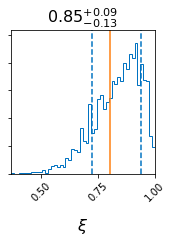

In [21]:
duty_cycle_result.plot_corner(truth={
  DUTY_CYCLE: FRACTION_WITH_SIGNAL
})

### c0 and c1  hyper parameter estimation

Assume that we do not know the distriution of the c0 and c1 parameters that we picked for the signals. 


We can choose to see how well a Gaussian model fits the distribution of the c0 and c1 parameters. In this case, our *hyper-models* is are two Gaussian models, one for c0 and another for c1. Our *hyper-parameters* describe the two Gaussian models. 

#### The math


\begin{align*}
&\log L(\vec{d}|\Lambda) &&= \sum_i \log  L(d_i|\Lambda)\\
& &&= \sum_i \log \bigg(\frac{Z_i}{n_i}\sum_k^{n_i}\frac{\pi(\theta_i^k|\Lambda)}{\pi(\theta_i^k)}\bigg) \\
& &&= \sum_i \bigg(\log Z_i-\log n_i + \log\sum_k^{n_i}\frac{\pi(\theta_i^k|\Lambda)}{\pi(\theta_i^k)}\bigg) \\
& &&= \sum_i \bigg(\log Z_i-\log n_i + \log\sum_k^{n_i}\exp \log\frac{\pi(\theta_i^k|\Lambda)}{\pi(\theta_i^k)}\bigg) \\
& &&= \sum_i \bigg(\log Z_i-\log n_i + \log\sum_k^{n_i}\exp (\log \pi(\theta_i^k|\Lambda) -\log \pi(\theta_i^k) )\bigg) \\
& &&= \sum_i \bigg(\log Z_i -\log n_i + \ \text{LSE}_k (\log \pi(\theta_i^k|\Lambda) -\log \pi(\theta_i^k) ) \bigg)
\end{align*}

Where LSE is scipy's `logsumexp` function.


### The code

In [0]:
# keys
C0_MU = 'c0_mu'
C0_SIGMA = 'c0_sigma'
C1_MU = 'c1_mu'
C1_SIGMA = 'c1_sigma'
# Latex labels
latex_C0_MU = '$c0_{\mu}$'
latex_C0_SIGMA = '$c0_{\sigma}$'
latex_C1_MU = '$c1_{\mu}$'
latex_C1_SIGMA = '$c1_{\sigma}$'

In [0]:
def get_c0c1_population_prior(num_sigma=3):
    c0_nsigma = num_sigma * C0_SIGMA_TRUE
    c1_nsigma = num_sigma * C1_SIGMA_TRUE
    priors = bilby.core.prior.PriorDict(
        {
            C0_MU: bilby.core.prior.Uniform(
                minimum=C0_MU_TRUE - c0_nsigma,
                maximum=C0_MU_TRUE + c0_nsigma,
                name=C0_MU,
                latex_label=latex_C0_MU,
            ),
            C0_SIGMA: bilby.core.prior.Uniform(
                minimum=0,
                maximum=C0_SIGMA_TRUE + c0_nsigma,
                name=C0_SIGMA,
                latex_label=latex_C0_SIGMA,
            ),
            C1_MU: bilby.core.prior.Uniform(
                minimum=C1_MU_TRUE - c1_nsigma,
                maximum=C1_MU_TRUE + c1_nsigma,
                name=C1_MU,
                latex_label=latex_C1_MU,
            ),
            C1_SIGMA: bilby.core.prior.Uniform(
                minimum=0,
                maximum=C1_SIGMA_TRUE + c1_nsigma,
                name=C1_SIGMA,
                latex_label=latex_C1_SIGMA,
            ),
        }
    )
    return priors


def get_c0c1_hyperprior(
    data, c0_mu, c0_sigma, c1_mu, c1_sigma
):
    c0_sample, c1_sample = data[C0_KEY], data[C1_KEY]
    hyperprior_c0 = norm.pdf(c0_sample, c0_mu, c0_sigma)
    hyperprior_c1 = norm.pdf(c1_sample, c1_mu, c1_sigma)
    hyper_prior = hyperprior_c0 * hyperprior_c1
    return hyper_prior


def get_c0c1_sample_prior(data):
    c0_sample, c1_sample = data[C0_KEY], data[C1_KEY]
    sample_prior = get_c0c1_prior().prob(
        {C0_KEY: c0_sample, C1_KEY: c1_sample}, axis=0
    )
    return sample_prior


def get_c0c1_population_likelihood(df):
    likelihood = bilby.hyper.likelihood.HyperparameterLikelihood(
        posteriors=[
            p[[C0_KEY, C1_KEY]] for p in df.posterior
        ],
        hyper_prior=get_c0c1_hyperprior,
        sampling_prior=get_c0c1_sample_prior,
        log_evidences=df.log_evidence
    )
    return likelihood

In [0]:
sampling_label = "C0C1_HyperParamPE"

def sample_c0c1_likelihood(df: pd.DataFrame, outdir):
    likelihood_fn = get_c0c1_population_likelihood(df)
    hyper_param_priors = get_c0c1_population_prior()
    
    result = bilby.run_sampler(
        likelihood=likelihood_fn,
        priors=hyper_param_priors,
        sampler='dynesty',
        npoints=500,
        walks=10,
        outdir=outdir,
        label=sampling_label
    )

    return result

In [0]:
c0c1_hyperpe_result = sample_c0c1_likelihood(only_signal_results_dataframe, outdir=OUT_DIR)

#### C0-C1 Population Hyper-PE Results

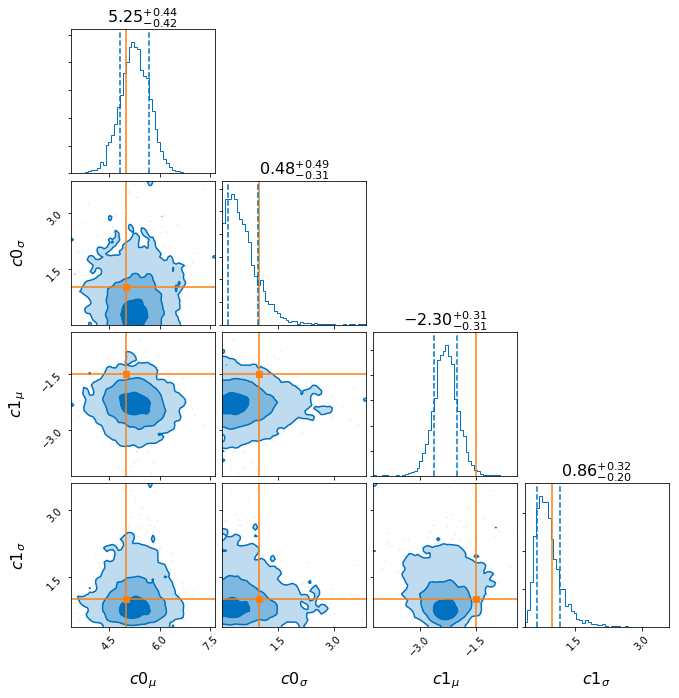

In [26]:
c0c1_hyperpe_result.plot_corner(truth={
  C0_MU: C0_MU_TRUE,
  C0_SIGMA:C0_SIGMA_TRUE,
  C1_MU: C1_MU_TRUE,
  C1_SIGMA: C1_SIGMA_TRUE
})